## Import Packages

In [1]:
import numpy as np
import pandas as pd
import networkx as nx
from utils.analyze import NetworkAnalysis
import matplotlib.pyplot as plt

## Import Data and Generate Networks

In [2]:
id_node = pd.read_csv('data/id_node.csv')
pre_ban_df = pd.read_csv('data/cleaned_data_before_ban.csv')
post_ban_df = pd.read_csv('data/cleaned_data_after_ban.csv')

pre_ban_obj = NetworkAnalysis(pre_ban_df)
pre_ban_mono = pre_ban_obj.gen_network(network_type='monopartite')
pre_ban_bi = pre_ban_obj.gen_network(network_type='bipartite')

post_ban_obj = NetworkAnalysis(post_ban_df)
post_ban_mono = post_ban_obj.gen_network(network_type='monopartite')
post_ban_bi = post_ban_obj.gen_network(network_type='bipartite')

pre_ban_mono_subset = pre_ban_obj.gen_subset_network(id_node, pre_ban_mono, network_type='monopartite')
post_ban_mono_subset = post_ban_obj.gen_subset_network(id_node, post_ban_mono, network_type='monopartite')

pre_ban_bi_subset = pre_ban_obj.gen_subset_network(id_node, pre_ban_bi, network_type='bipartite')
post_ban_bi_subset = post_ban_obj.gen_subset_network(id_node, post_ban_bi, network_type='bipartite')

## Plot Full Networks

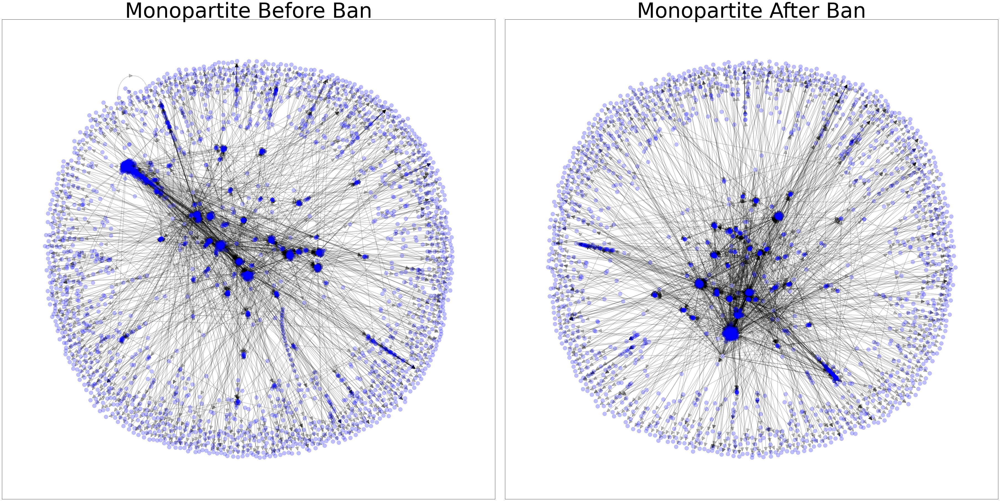

In [3]:
NetworkAnalysis.plot_network_comparison([pre_ban_obj, post_ban_obj],
                                        [pre_ban_mono,post_ban_mono], network_type='monopartite')                                       

Network before ban is bipartite: True
Network after ban is bipartite: True


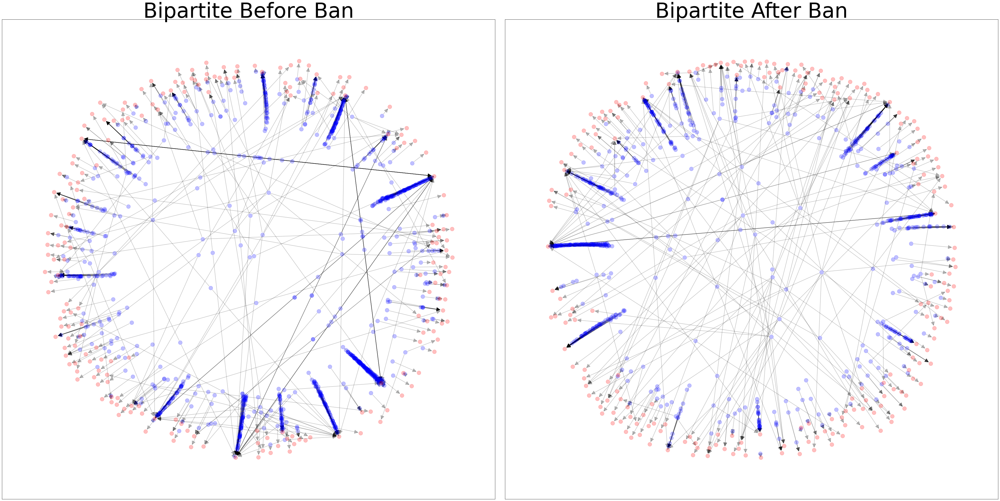

In [4]:
NetworkAnalysis.plot_network_comparison([pre_ban_obj, post_ban_obj],
                                        [pre_ban_bi,post_ban_bi], network_type='bipartite') 

## Plot Subset Networks

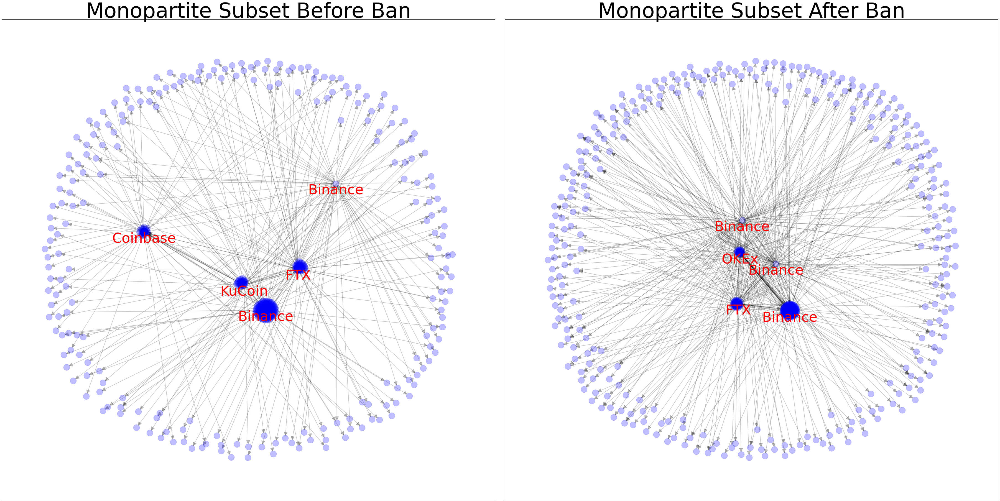

In [5]:
NetworkAnalysis.plot_subset_network_comparison(id_node,pre_ban_mono_subset,post_ban_mono_subset, network_type='monopartite')

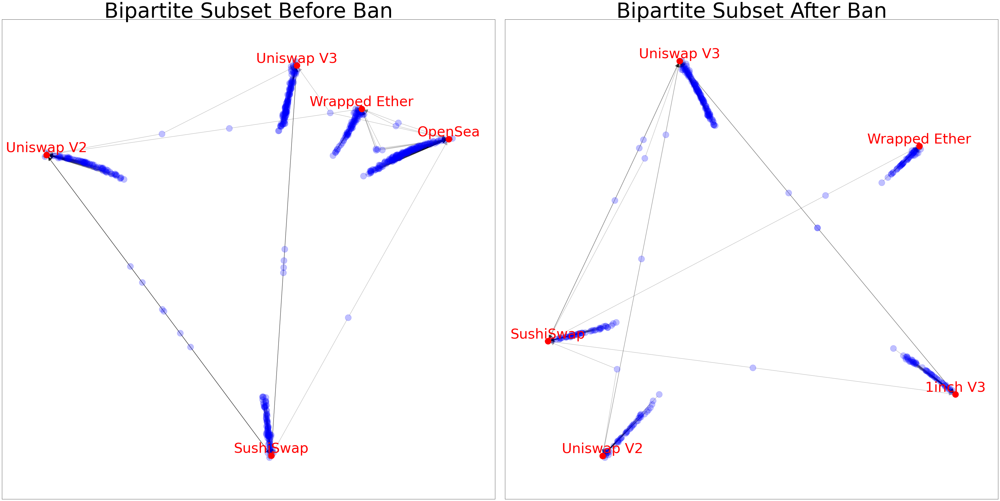

In [6]:
NetworkAnalysis.plot_subset_network_comparison(id_node,pre_ban_bi_subset,post_ban_bi_subset, network_type='bipartite')

## Degree Summary Statistics

In [5]:
pre_ban_mono_k = NetworkAnalysis.cal_degree(pre_ban_mono)
post_ban_mono_k = NetworkAnalysis.cal_degree(post_ban_mono)
pre_ban_bi_k = NetworkAnalysis.cal_degree(pre_ban_bi)
post_ban_bi_k = NetworkAnalysis.cal_degree(post_ban_bi)

NetworkAnalysis.degree_stats(pre_ban_mono_k, post_ban_mono_k, pre_ban_bi_k, post_ban_bi_k)

Overall Degree Summary Statistics:
+-------+---------------------+----------------------+-------------------+--------------------+
| Stats | Monopartite Pre-Ban | Monopartite Post-Ban | Bipartite Pre-Ban | Bipartite Post-Ban |
+-------+---------------------+----------------------+-------------------+--------------------+
|  Mean |         2.02        |         2.34         |        1.83       |        1.81        |
|  Min  |          1          |          1           |         1         |         1          |
|  Max  |         269         |         306          |        152        |        123         |
|  Std  |         6.72        |         8.61         |        7.53       |        5.78        |
+-------+---------------------+----------------------+-------------------+--------------------+


## Degree Distribution

/Users/mattheus/Documents/GitHub/smm638-mtp/utils/analyze.py:318: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax1.set_xlim(0,150)
/Users/mattheus/Documents/GitHub/smm638-mtp/utils/analyze.py:319: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax1.set_ylim(0,1200)
/Users/mattheus/Documents/GitHub/smm638-mtp/utils/analyze.py:336: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax2.set_xlim(0,150)
/Users/mattheus/Documents/GitHub/smm638-mtp/utils/analyze.py:337: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax2.set_ylim(0,1200)
/Users/mattheus/Documents/GitHub/smm638-mtp/utils/analyze.py:354: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax3.set_xlim(0,150)
/Users/mattheus/Document

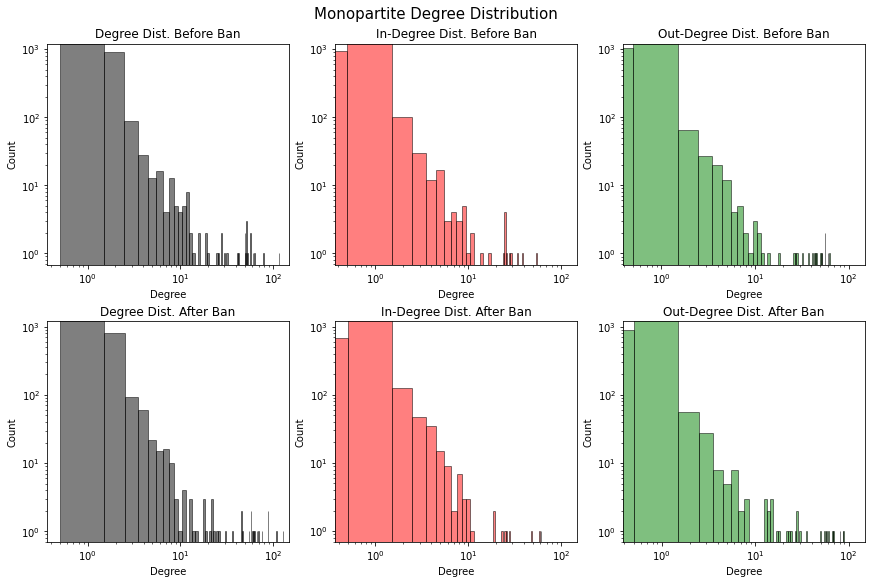

In [5]:
NetworkAnalysis.plot_degree_dist(pre_ban_mono,post_ban_mono,"Monopartite Degree Distribution",figsize=(12,8))

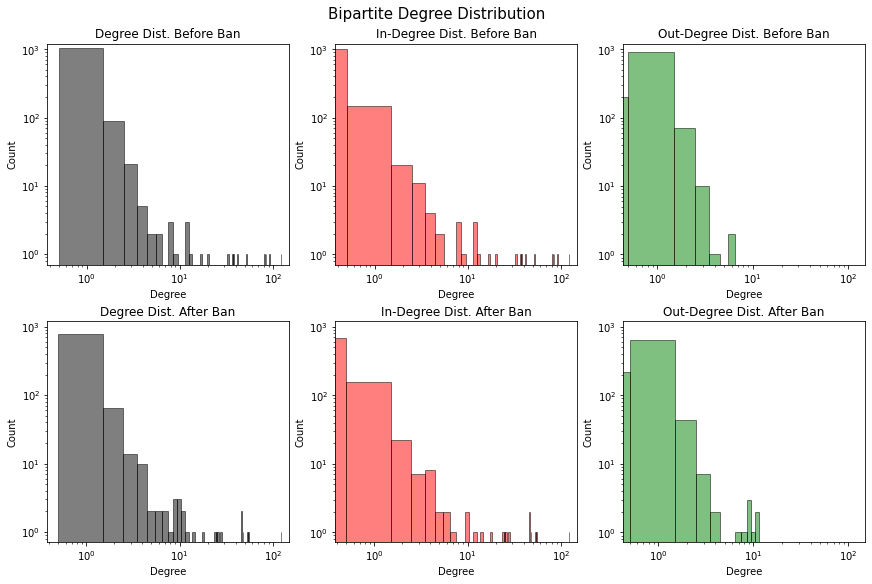

In [6]:
NetworkAnalysis.plot_degree_dist(pre_ban_bi,post_ban_bi,"Bipartite Degree Distribution",figsize=(12,8))

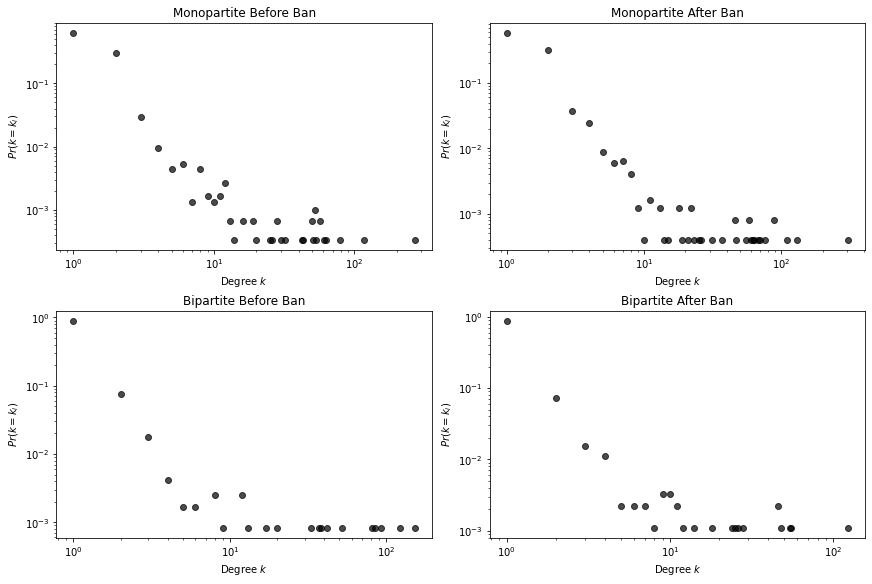

In [7]:
NetworkAnalysis.plot_power_law(pre_ban_mono,post_ban_mono,pre_ban_bi,post_ban_bi)

## Centrality Summary Statistics

In [8]:
bc_1 = NetworkAnalysis.cal_betweenness_cen(pre_ban_mono); bc_2 = NetworkAnalysis.cal_betweenness_cen(post_ban_mono)
ec_1 = NetworkAnalysis.cal_eig_cen(pre_ban_mono); ec_2 = NetworkAnalysis.cal_eig_cen(post_ban_mono)
dc_1 = NetworkAnalysis.cal_deg_cen(pre_ban_mono); dc_2 = NetworkAnalysis.cal_deg_cen(post_ban_mono)
cc_1 = NetworkAnalysis.cal_close_cen(pre_ban_mono); cc_2 = NetworkAnalysis.cal_close_cen(post_ban_mono)

NetworkAnalysis.centrality_stats(bc_1,bc_2,ec_1,ec_2,dc_1,dc_2,cc_1,cc_2,
                                 'Monopartite Network Centrality Measures')

Monopartite Network Centrality Measures:
+-------+-----------------------+------------------------+------------------------+-------------------------+
| Stats | Betweeness C. Pre-Ban | Betweeness C. Post-Ban | Eigenvector C. Pre-Ban | Eigenvector C. Post-Ban |
+-------+-----------------------+------------------------+------------------------+-------------------------+
|  Mean |        0.00019        |        0.00024         |        0.00686         |         0.00787         |
|  Min  |          0.0          |          0.0           |          0.0           |           0.0           |
|  Max  |        0.08476        |        0.09732         |        0.21398         |         0.24698         |
|  Std  |        0.00183        |        0.00235         |        0.01699         |         0.01842         |
+-------+-----------------------+------------------------+------------------------+-------------------------+
+-------+-------------------+--------------------+----------------------+------

In [9]:
bc_1 = NetworkAnalysis.cal_betweenness_cen(pre_ban_bi); bc_2 = NetworkAnalysis.cal_betweenness_cen(post_ban_bi)
ec_1 = NetworkAnalysis.cal_eig_cen(pre_ban_bi); ec_2 = NetworkAnalysis.cal_eig_cen(post_ban_bi)
dc_1 = NetworkAnalysis.cal_deg_cen(pre_ban_bi); dc_2 = NetworkAnalysis.cal_deg_cen(post_ban_bi)
cc_1 = NetworkAnalysis.cal_close_cen(pre_ban_bi); cc_2 = NetworkAnalysis.cal_close_cen(post_ban_bi)

NetworkAnalysis.centrality_stats(bc_1,bc_2,ec_1,ec_2,dc_1,dc_2,cc_1,cc_2,
                                 'Bipartite Network Centrality Measures')

Bipartite Network Centrality Measures:
+-------+-----------------------+------------------------+------------------------+-------------------------+
| Stats | Betweeness C. Pre-Ban | Betweeness C. Post-Ban | Eigenvector C. Pre-Ban | Eigenvector C. Post-Ban |
+-------+-----------------------+------------------------+------------------------+-------------------------+
|  Mean |          0.0          |          0.0           |        0.00351         |         0.00516         |
|  Min  |          0.0          |          0.0           |         6e-05          |          7e-05          |
|  Max  |          0.0          |          0.0           |        0.57262         |         0.69025         |
|  Std  |          0.0          |          0.0           |        0.02869         |         0.03276         |
+-------+-----------------------+------------------------+------------------------+-------------------------+
+-------+-------------------+--------------------+----------------------+--------

## Modularity

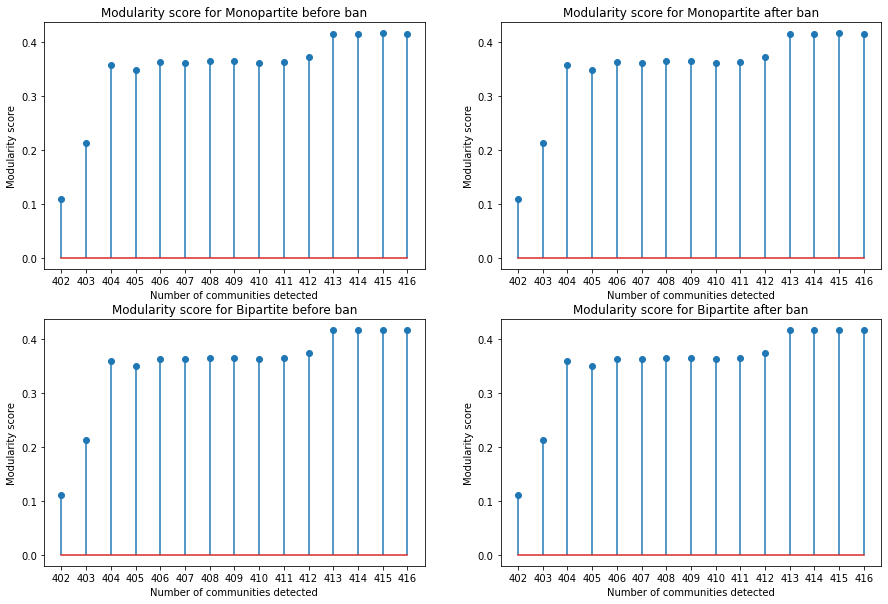

In [10]:
modularity_scores = pd.read_csv('data/modularity_scores.csv',index_col=0)
NetworkAnalysis.plot_modularity_scores(modularity_scores, figsize=(15,10))